## QC and Analysis of cells from SKM 
By Monika Litvinukova <br/>
Latest update 27.05.20

### Import required modules

In [1]:
import bbknn
import anndata
import numpy as np
import pandas as pd
import scanpy as sc
import scipy as sp
import seaborn as sb
from matplotlib import rcParams
from matplotlib import colors
import matplotlib.pyplot as plt

/opt/conda/lib/python3.7/site-packages/dask/config.py:161: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}


In [2]:
def regress_pca(pca, batch):
    regressors = np.zeros(pca.shape, dtype = 'float64')
    regressed = np.zeros(pca.shape, dtype = 'float64')
    for category in np.unique(batch):
        mask = (category == batch)
        regressors[mask,:] = np.mean(pca[mask,:],axis = 0)
    for i in range(pca.shape[1]):
        t = np.c_[np.ones(regressors[:,i].shape),regressors[:,i]]
        b = np.dot(np.dot(np.linalg.inv(np.dot(t.T,t)),t.T),pca[:,i])
        regressed[:,i] = pca[:,i] - b[0] - b[1] * t[:,1]
    return regressed

In [3]:
sc.settings.verbosity = 3
sc.logging.print_version_and_date()
sc.settings.set_figure_params(dpi = 160, color_map = 'RdPu', dpi_save = 180, vector_friendly = True, format = 'svg')

Running Scanpy 1.4.4.post1, on 2020-05-27 16:20.


## Read in data

In [4]:
cells_raw = sc.read_h5ad('/home/jovyan/mona_data/SKM/hca_skm_cells_scrublet_ctl190916.h5ad')
cells_raw

AnnData object with n_obs × n_vars = 2197021 × 33538 
    obs: 'CoD', 'NRP', 'age', 'batch', 'donor', 'gender', 'sample', 'source', 'version', 'n_counts', 'percent_mito', 'percent_ribo', 'scrublet_score'
    var: 'gene_ids-mus_SNuc7444586', 'feature_types-mus_SNuc7444586', 'gene_ids-mus_SNuc7468112', 'feature_types-mus_SNuc7468112', 'gene_ids-mus_SNuc7511880', 'feature_types-mus_SNuc7511880', 'gene_ids-5386STDY7600838', 'feature_types-5386STDY7600838', 'gene_ids-5386STDY7645353', 'feature_types-5386STDY7645353', 'gene_ids-5386STDY7645354', 'feature_types-5386STDY7645354'

In [6]:
pd.crosstab(cells_raw.obs['donor'], cells_raw.obs['sample'])

sample,5386STDY7600838,5386STDY7645353,5386STDY7645354,mus_SNuc7444586,mus_SNuc7468112,mus_SNuc7511880
donor,,,,,,
A17,0,0,0,0,0,343528
A19,0,0,0,230630,0,0
A20,0,0,0,0,448936,0
A23,374392,0,0,0,0,0
A25,0,398775,400760,0,0,0


## Compute QC metrics and filter low quality cells

In [7]:
# Calculate the total counts
cells_raw.obs['n_counts'].describe()

count    2.197021e+06
mean     7.008376e+01
std      6.415641e+02
min      1.000000e+00
25%      1.000000e+00
50%      2.000000e+00
75%      5.000000e+00
max      9.200000e+04
Name: n_counts, dtype: float64

In [8]:
## remove empty drops
sc.pp.filter_cells(data = cells_raw, min_counts = 70)
print('Total number of cells after removing empty droplets: {:d}'.format(cells_raw.n_obs))

filtered out 1998458 cells that haveless than 70 counts
Total number of cells after removing empty droplets: 198563


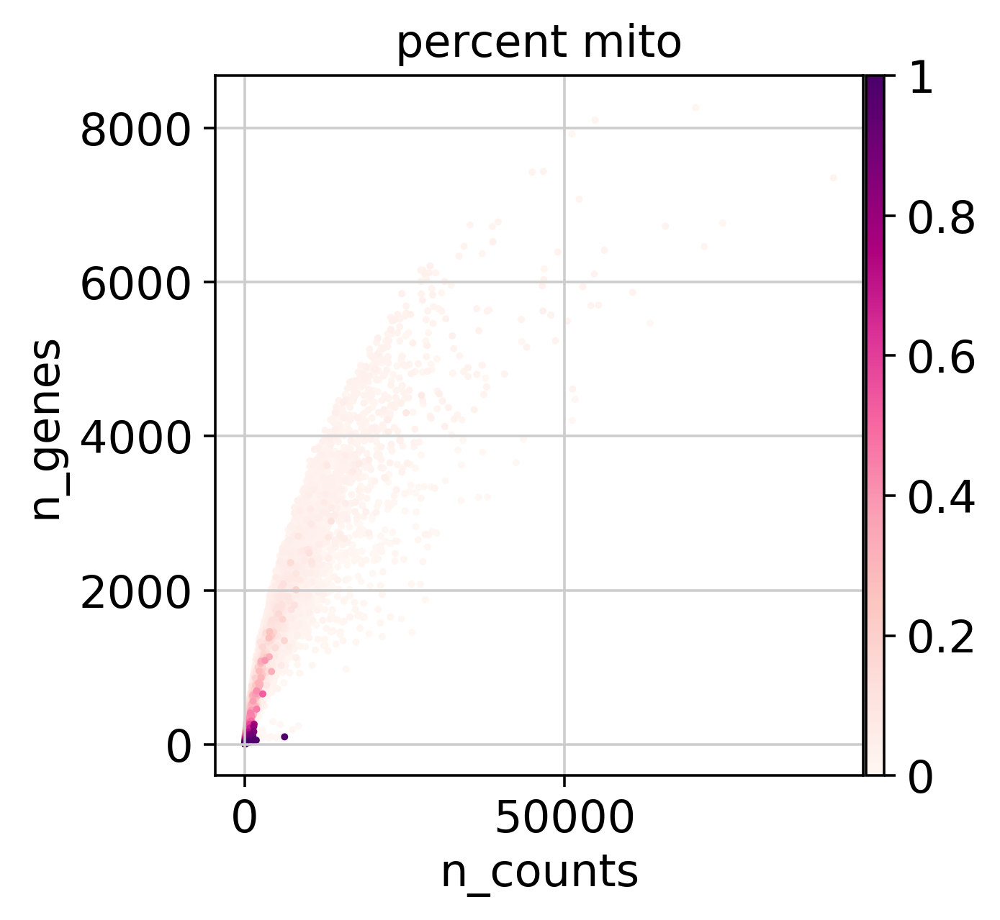

In [9]:
# Data quality summary plots
sc.settings.set_figure_params(dpi = 160, color_map = 'RdPu', dpi_save = 180, vector_friendly = True, format = 'svg')
cells_raw.obs['n_genes'] = (cells_raw.X > 0).sum(1)
sc.pl.scatter(cells_raw, 'n_counts', 'n_genes', color = 'percent_mito', size = 20)
#sc.pl.scatter(cd45_raw[cd45_raw.obs['n_counts'] < 20000], 'n_counts', 'n_genes', color = 'percent_mito', size = 20)

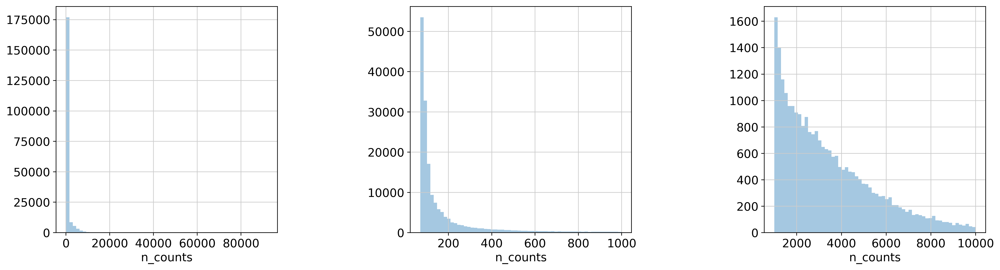

In [10]:
# Thresholding decision: counts

rcParams['figure.figsize']=(20,5)
fig_ind = np.arange(131, 134)
fig = plt.figure()
fig.subplots_adjust(hspace = 0.4, wspace = 0.6)

sb.distplot(cells_raw.obs['n_counts'], kde = False, bins = 60, ax = fig.add_subplot(fig_ind[0]))
sb.distplot(cells_raw.obs['n_counts'][cells_raw.obs['n_counts'] < 1000], kde = False, bins = 60, ax = fig.add_subplot(fig_ind[1]))
sb.distplot(cells_raw.obs['n_counts'][(cells_raw.obs['n_counts'] > 1000) & (cells_raw.obs['n_counts'] < 10000)], kde = False, bins = 60, ax = fig.add_subplot(fig_ind[2]))

plt.show()

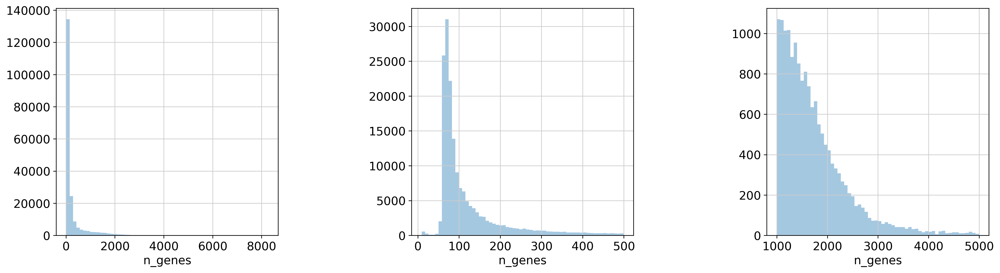

In [11]:
# Thresholding decision: genes

rcParams['figure.figsize']=(20,5)
fig_ind = np.arange(131, 134)
fig = plt.figure()
fig.subplots_adjust(hspace = 0.4, wspace = 0.6)

sb.distplot(cells_raw.obs['n_genes'], kde = False, bins = 60, ax = fig.add_subplot(fig_ind[0]))
sb.distplot(cells_raw.obs['n_genes'][cells_raw.obs['n_genes'] < 500], kde = False, bins = 60, ax = fig.add_subplot(fig_ind[1]))
sb.distplot(cells_raw.obs['n_genes'][(cells_raw.obs['n_genes'] > 1000) & (cells_raw.obs['n_genes'] < 5000)], kde = False, bins = 60, ax = fig.add_subplot(fig_ind[2]))

plt.show()

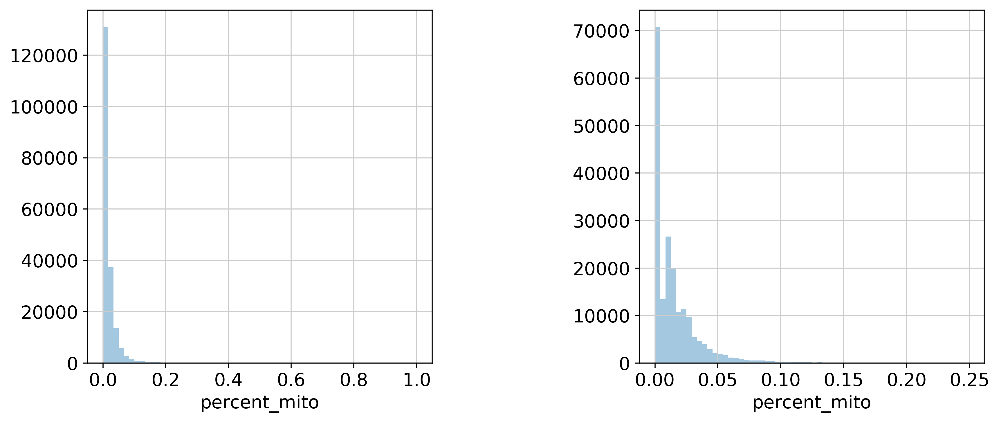

In [19]:
# Thresholding decision: mitochondrial reads

rcParams['figure.figsize']=(20,5)
fig_ind=np.arange(131, 133)
fig = plt.figure()
fig.subplots_adjust(hspace=0.4, wspace=0.6)

sb.distplot(cells_raw.obs['percent_mito'], kde=False, bins=60, ax=fig.add_subplot(fig_ind[0]))
sb.distplot(cells_raw.obs['percent_mito'][cells_raw.obs['percent_mito'] < 0.25], kde=False, bins=60, ax=fig.add_subplot(fig_ind[1]))
plt.show()

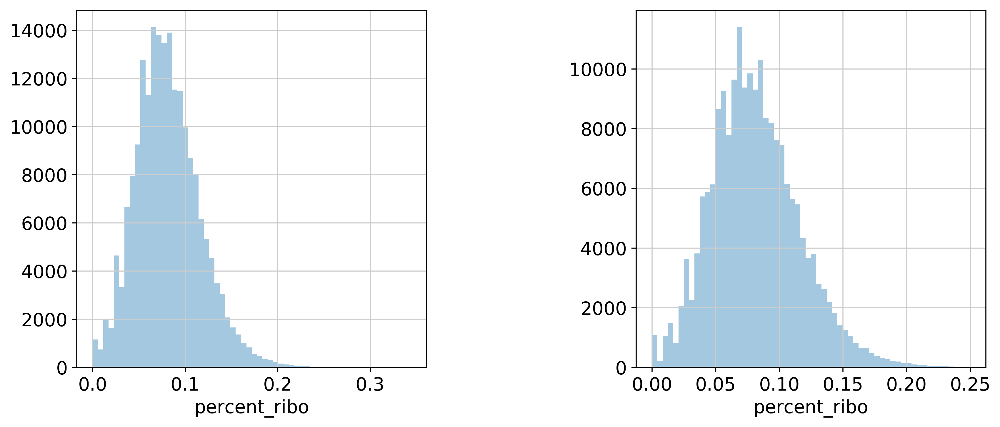

In [18]:
# Thresholding decision: ribosomal reads

rcParams['figure.figsize']=(20,5)
fig_ind=np.arange(131, 133)
fig = plt.figure()
fig.subplots_adjust(hspace=0.4, wspace=0.6)

sb.distplot(cells_raw.obs['percent_ribo'], kde=False, bins=60, ax=fig.add_subplot(fig_ind[0]))
sb.distplot(cells_raw.obs['percent_ribo'][cells_raw.obs['percent_ribo'] < 0.25], kde=False, bins=60, ax=fig.add_subplot(fig_ind[1]))
plt.show()

/opt/conda/lib/python3.7/site-packages/numpy/lib/histograms.py:829: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/opt/conda/lib/python3.7/site-packages/numpy/lib/histograms.py:830: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


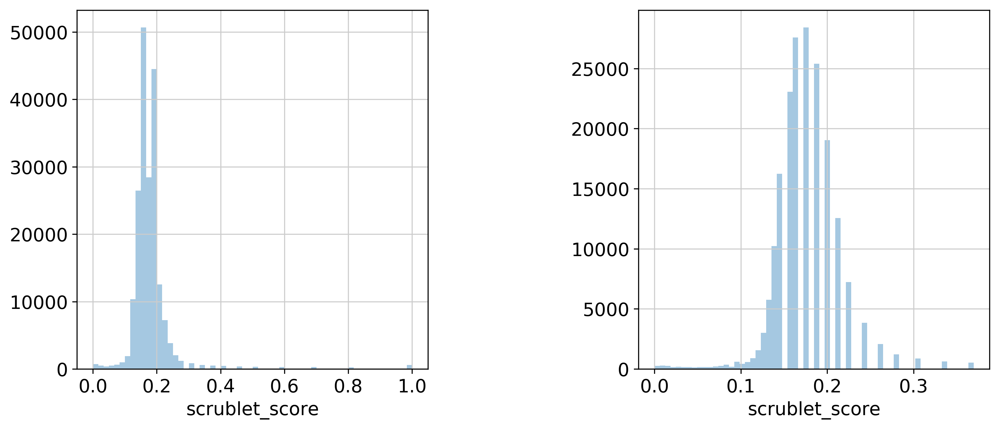

In [14]:
# Thresholding decision: Scrublet

rcParams['figure.figsize']=(20,5)
fig_ind=np.arange(131, 133)
fig = plt.figure()
fig.subplots_adjust(hspace=0.4, wspace=0.6)

sb.distplot(cells_raw.obs['scrublet_score'], kde=False, bins=60, ax=fig.add_subplot(fig_ind[0]))
sb.distplot(cells_raw.obs['scrublet_score'][cells_raw.obs['scrublet_score'] < 0.4], kde=False, bins=60, ax=fig.add_subplot(fig_ind[1]))
plt.show()

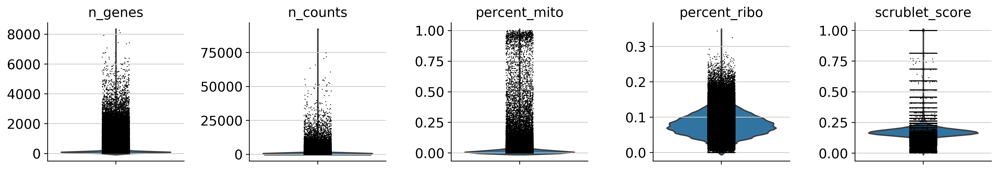

In [15]:
sc.pl.violin(cells_raw, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo', 'scrublet_score'], jitter = 0.1, multi_panel = True)

In [16]:
cells_filtered = cells_raw.copy()

In [17]:
# heart filters: <br/>
#   - counts: 500 - 15 000,<br/>
#   - genes: 300 - 5 000,<br/>
#   - mito max 20% (cells),max 5% (nuclei),<br/>
#   - ribo max 20%(cells),max 5% (nuclei),<br/>
#   - scrublet max 0.3<br/>

# Filter cells according to identified QC thresholds:
print('Total number of cells before filtering: {:d}'.format(cells_filtered.n_obs))

sc.pp.filter_cells(cells_filtered, min_counts = 500)
sc.pp.filter_cells(cells_filtered, max_counts = 15000)
sc.pp.filter_cells(cells_filtered, min_genes = 300)
sc.pp.filter_cells(cells_filtered, max_genes = 6000)
cells_filtered = cells_filtered[cells_filtered.obs['percent_mito'] < 0.2]
cells_filtered = cells_filtered[cells_filtered.obs['percent_ribo'] < 0.2]
cells_filtered = cells_filtered[cells_filtered.obs['scrublet_score'] < 0.3]

print('Total number of cells after filtering: {:d}'.format(cells_filtered.n_obs))

#Filter genes:
print('Total number of genes: {:d}'.format(cells_filtered.n_vars))

Total number of cells before filtering: 198563
filtered out 161392 cells that haveless than 500 counts
filtered out 602 cells that havemore than 15000 counts
filtered out 936 cells that haveless than 300 genes expressed
Total number of cells after filtering: 34577
Total number of genes: 33538


/opt/conda/lib/python3.7/site-packages/anndata/_core/anndata.py:1118: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning,


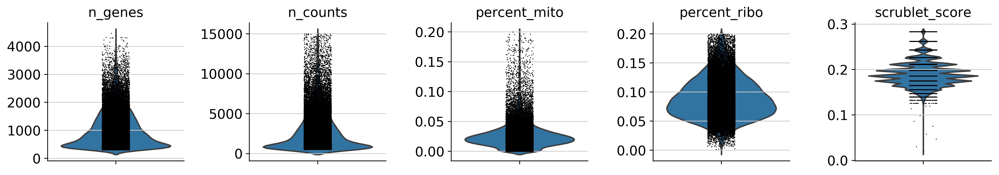

In [20]:
sc.pl.violin(cells_filtered, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo', 'scrublet_score'], jitter = 0.1, multi_panel = True)

## Pre-process the dataset

In [21]:
cells_processed = cells_filtered.copy()
sc.pp.normalize_per_cell(cells_processed, counts_per_cell_after = 1e4)
sc.pp.log1p(cells_processed)
cells_processed.raw = cells_processed.copy()
cells_processed.shape

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


(34577, 33538)

In [22]:
sc.pp.highly_variable_genes(cells_processed, flavor = 'seurat')
cells_hvg = cells_processed[:, cells_processed.var['highly_variable']]
cells_hvg.shape

extracting highly variable genes
    finished (0:00:06)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


(34577, 2482)

In [24]:
sc.pp.scale(cells_hvg, max_value = 10)

/opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:869: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [25]:
sc.pp.pca(cells_hvg, n_comps = 50, use_highly_variable = True, svd_solver = 'arpack')
sc.pp.neighbors(cells_hvg)
sc.tl.umap(cells_hvg)

computing PCA with n_comps = 50
computing PCA on highly variable genes
    finished (0:00:12)
computing neighbors
    using 'X_pca' with n_pcs = 50


/opt/conda/lib/python3.7/site-packages/numba/compiler.py:602: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../opt/conda/lib/python3.7/site-packages/umap/rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  self.func_ir.loc))
/opt/conda/lib/python3.7/site-packages/umap/nndescent.py:92: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../opt/conda/lib/python3.7/site-packages/umap/utils.py", line 409:
@numba.njit(

    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:11)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:38)


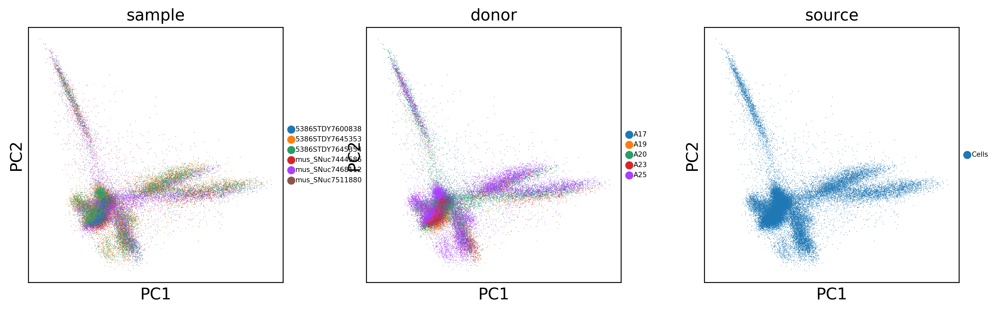

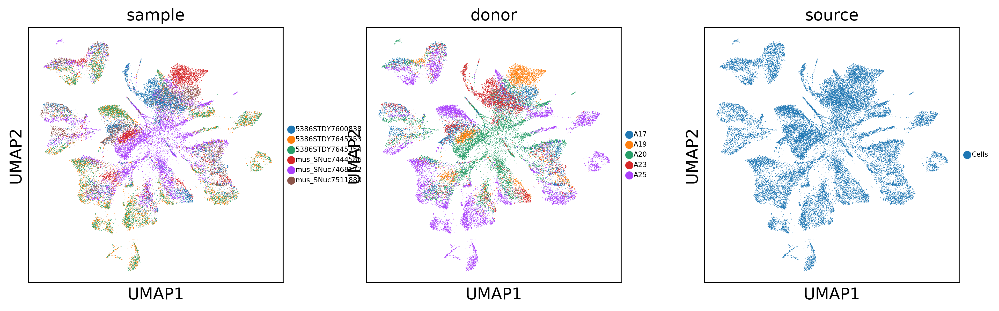

In [26]:
sc.settings.set_figure_params(dpi = 160, color_map = 'RdPu', dpi_save = 180, vector_friendly = True, format = 'svg')
sc.pl.pca_scatter(cells_hvg, color = ['sample', 'donor', 'source'], size = 1, legend_fontsize = 6)
sc.pl.umap(cells_hvg, color = ['sample', 'donor', 'source'], size = 1, legend_fontsize = 6)

## Batch correction

- donor

In [27]:
lrkp9_donor = cells_hvg.copy()
lrkp9_donor.obsm['X_pca_original'] = lrkp9_donor.obsm['X_pca'].copy()
lrkp9_donor.obsm['X_pca'] = regress_pca(lrkp9_donor.obsm['X_pca'], lrkp9_donor.obs['donor'])

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	'distances', weighted adjacency matrix
	'connectivities', weighted adjacency matrix (0:00:10)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:44)


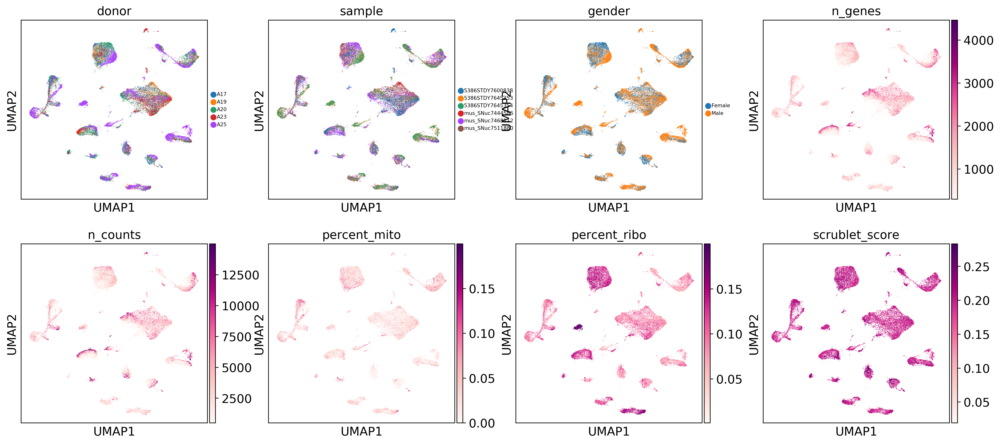

In [31]:
bbknn_donor = bbknn.bbknn(lrkp9_donor, neighbors_within_batch = 5, batch_key = 'donor', approx = True, copy = True, n_trees = 30)
sc.tl.umap(bbknn_donor, min_dist = 0.1, spread = 3, random_state = 1712)
sc.pl.umap(bbknn_donor, color = ['donor', 'sample', 'gender', 'n_genes', 'n_counts', 'percent_mito', 'percent_ribo', 'scrublet_score'], size = 1, legend_fontsize = 6, color_map = 'RdPu')

running Leiden clustering
    finished: found 21 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:28)


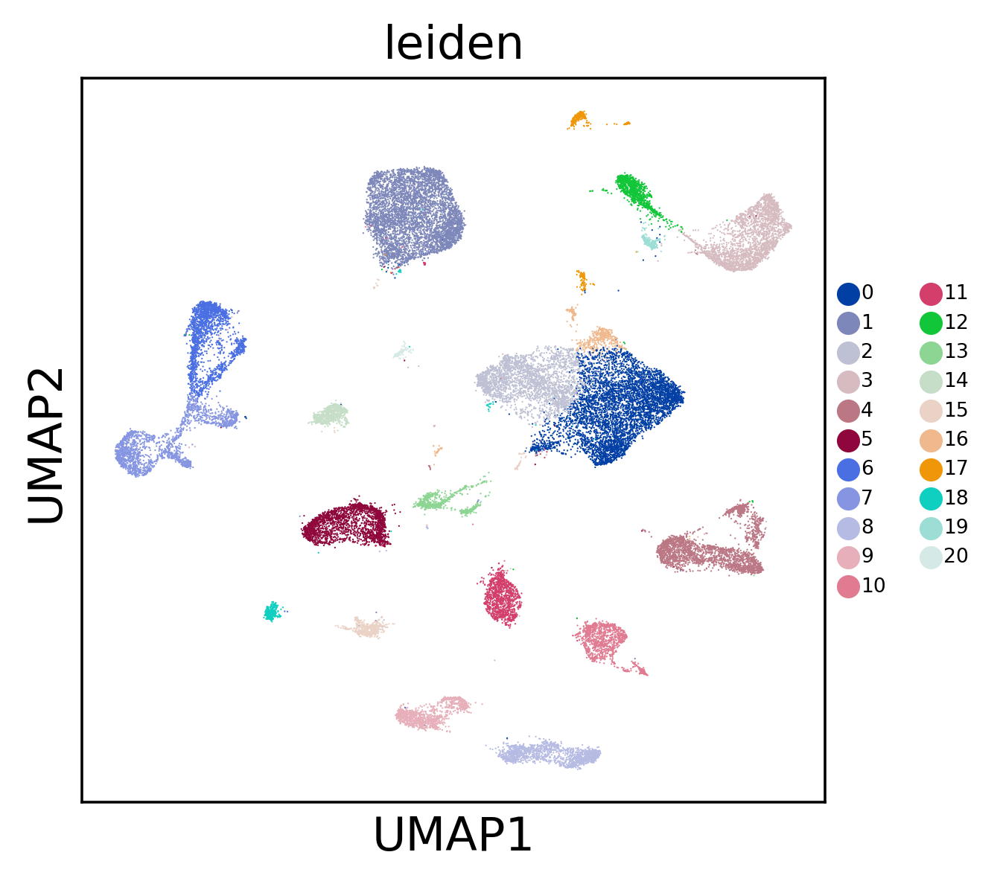

In [37]:
sc.tl.leiden(bbknn_donor, resolution = 0.8, random_state = 1712)
sc.pl.umap(bbknn_donor, color = ['leiden'], size = 1, legend_fontsize = 6, color_map = 'RdPu')

## Annotate the dataset

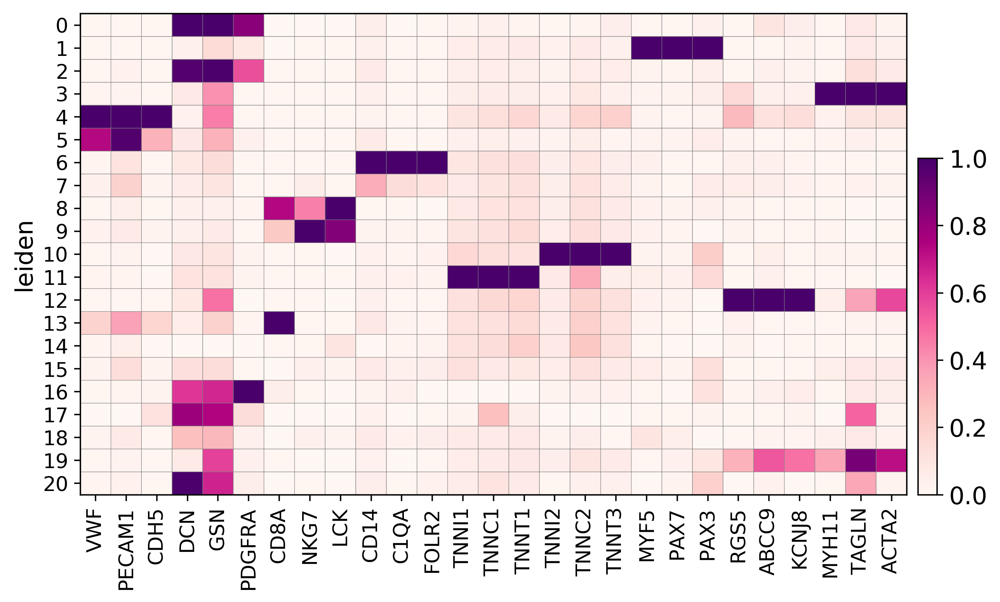

GridSpec(2, 3, height_ratios=[0, 10.5], width_ratios=[8.64, 0, 0.2])

In [38]:
sc.pl.matrixplot(bbknn_donor, markers1, groupby = 'leiden', cmap = 'RdPu', dendrogram = False,  standard_scale = 'var')

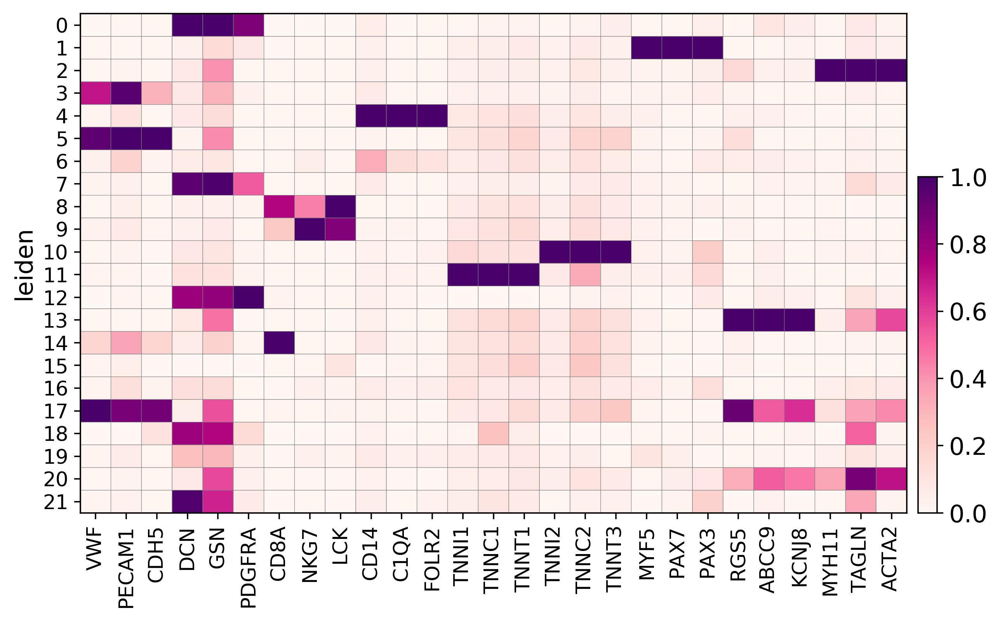

GridSpec(2, 3, height_ratios=[0, 10.5], width_ratios=[8.64, 0, 0.2])

In [36]:
markers1 = [ 'VWF', 'PECAM1', 'CDH5',
            'DCN', 'GSN', 'PDGFRA', 
             'CD8A', 'NKG7', 'LCK', 
              'CD14', 'C1QA', 'FOLR2',
    'TNNI1', 'TNNC1', 'TNNT1',
            'TNNI2', 'TNNC2', 'TNNT3',
    'MYF5', 'PAX7', 'PAX3',
              'RGS5', 'ABCC9', 'KCNJ8',
             'MYH11', 'TAGLN', 'ACTA2']
sc.pl.matrixplot(bbknn_donor, markers1, groupby = 'leiden', cmap = 'RdPu', dendrogram = False,  standard_scale = 'var')

### Call markers on leiden

In [39]:
sc.tl.rank_genes_groups(bbknn_donor, 'leiden', method = 'wilcoxon', use_raw = True)
result = bbknn_donor.uns['rank_genes_groups']
groups = result['names'].dtype.names
wilcox_clusters = pd.DataFrame(
{group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'logfoldchanges', 'pvals_adj']})
wilcox_clusters.head(10)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:41)


,0_n,0_l,0_p,1_n,1_l,1_p,2_n,2_l,2_p,3_n,...,17_p,18_n,18_l,18_p,19_n,19_l,19_p,20_n,20_l,20_p
0,APOD,7.005430,0.0,MEG3,5.253226,0.0,MFAP5,5.301490,0.0,TAGLN,...,2.831448e-120,TPSB2,11.432137,2.132298e-214,TAGLN,5.406488,7.926721e-106,THBS4,6.252987,5.869143e-79
1,DCN,5.905321,0.0,APOC1,6.071579,0.0,CFD,5.049526,0.0,MYL9,...,3.186352e-98,TPSAB1,11.434419,3.895393e-207,IGFBP7,4.149571,1.554411e-103,MYOC,6.114526,5.976933e-74
2,CFD,5.654107,0.0,APOE,5.951173,0.0,IGFBP6,4.605407,0.0,ACTA2,...,1.068183e-97,CTSG,10.253408,1.063896e-150,C2orf40,6.850416,4.162576e-94,PRELP,5.796419,2.187945e-72
3,GSN,4.218149,0.0,DLK1,6.146083,0.0,S100A6,2.301253,0.0,ADIRF,...,7.965107e-87,FTH1,1.706761,5.645376e-105,CALD1,3.518502,6.423319e-91,RARRES1,6.090228,6.953513e-66
4,GPX3,3.989321,0.0,MYF5,6.752060,0.0,DCN,5.110882,0.0,DSTN,...,1.793490e-85,CMA1,10.190898,6.174441e-80,TGFBI,4.249038,2.690354e-84,DCN,4.763148,1.983231e-60
5,ADH1B,5.317406,0.0,RPL3,1.424845,0.0,S100A10,3.082472,0.0,MYH11,...,1.207111e-84,HPGD,7.562252,2.630470e-69,MYL9,4.122292,9.801074e-84,APOD,4.995347,9.081257e-57
6,C1S,4.062751,0.0,IGFBP5,3.514722,0.0,GSN,3.782671,0.0,CALD1,...,1.341794e-78,PTMA,1.087450,3.643037e-55,TM4SF1,4.243948,1.676353e-79,TNMD,9.233806,1.077070e-51
7,MGP,3.377956,0.0,RPL10A,1.381814,0.0,FSTL1,4.165830,0.0,TPM2,...,2.015591e-78,RPS4X,0.914576,1.180662e-51,IGFBP5,3.715387,1.947495e-77,AEBP1,4.668166,5.761193e-48
8,SERPINF1,3.582042,0.0,RPS18,1.020583,0.0,PRG4,5.753039,0.0,MYL6,...,8.584726e-77,H3F3B,1.051764,3.815693e-50,ACTA2,4.306086,3.993965e-75,FBLN1,3.590016,2.135244e-42
9,MGST1,4.138096,0.0,RPS6,1.072873,0.0,PCOLCE2,5.351786,0.0,PPP1R14A,...,1.001701e-75,SRGN,2.761121,4.337859e-50,SOD3,3.384679,2.001218e-62,FMOD,6.245471,3.895718e-42


In [40]:
wilcox_clusters.to_csv('/home/jovyan/mona_data/SKM/DEG_SKM_cells_ml200527_wilcox08.csv', index = False, sep = ',')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`


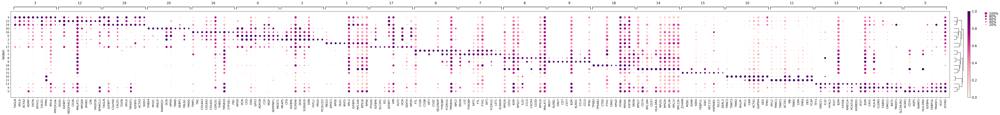

In [43]:
sc.tl.dendrogram(bbknn_donor, groupby = 'leiden')
sc.pl.rank_genes_groups_dotplot(bbknn_donor, n_genes = 10, color_map = 'RdPu',  standard_scale = 'var')

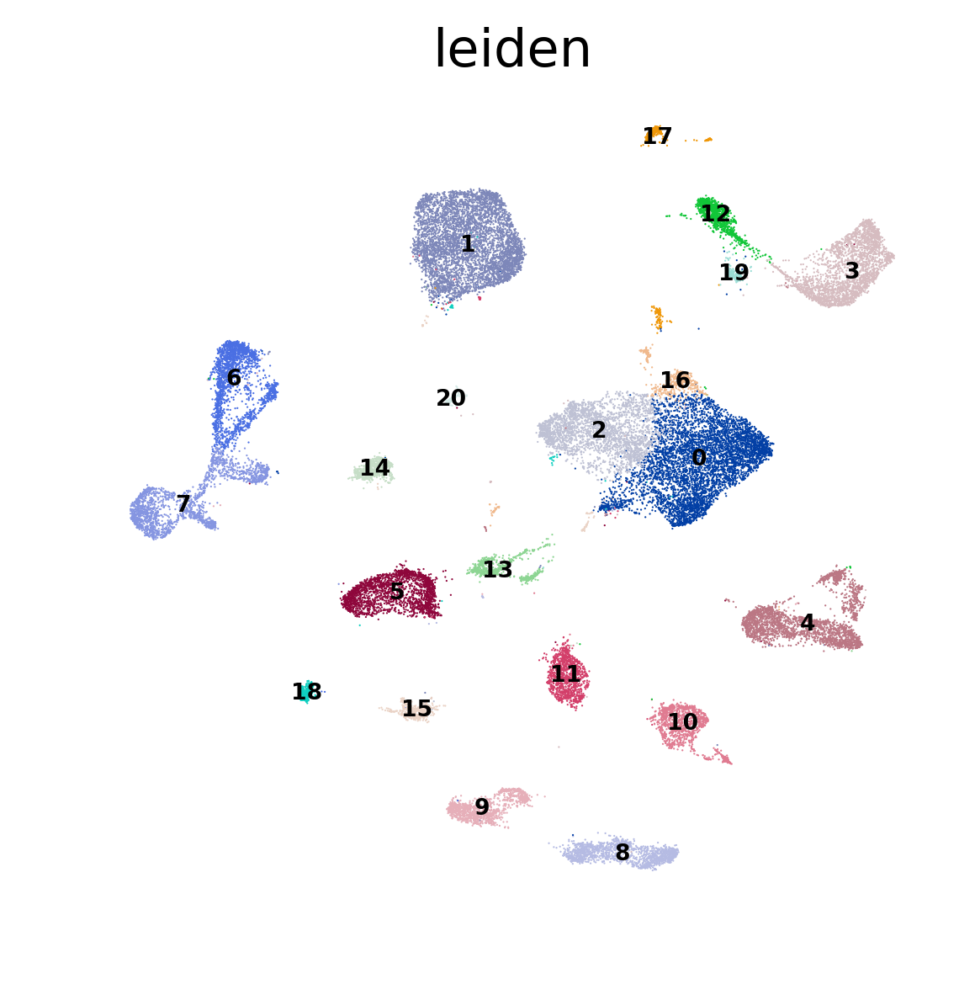

In [44]:
sc.pl.umap(bbknn_donor, color = ['leiden'], size = 1, legend_fontsize = 6, legend_loc = 'on data', frameon = False)

In [45]:
bbknn_donor.obs['leiden'].cat.categories

Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '14', '15', '16', '17', '18', '19', '20'],
      dtype='object')

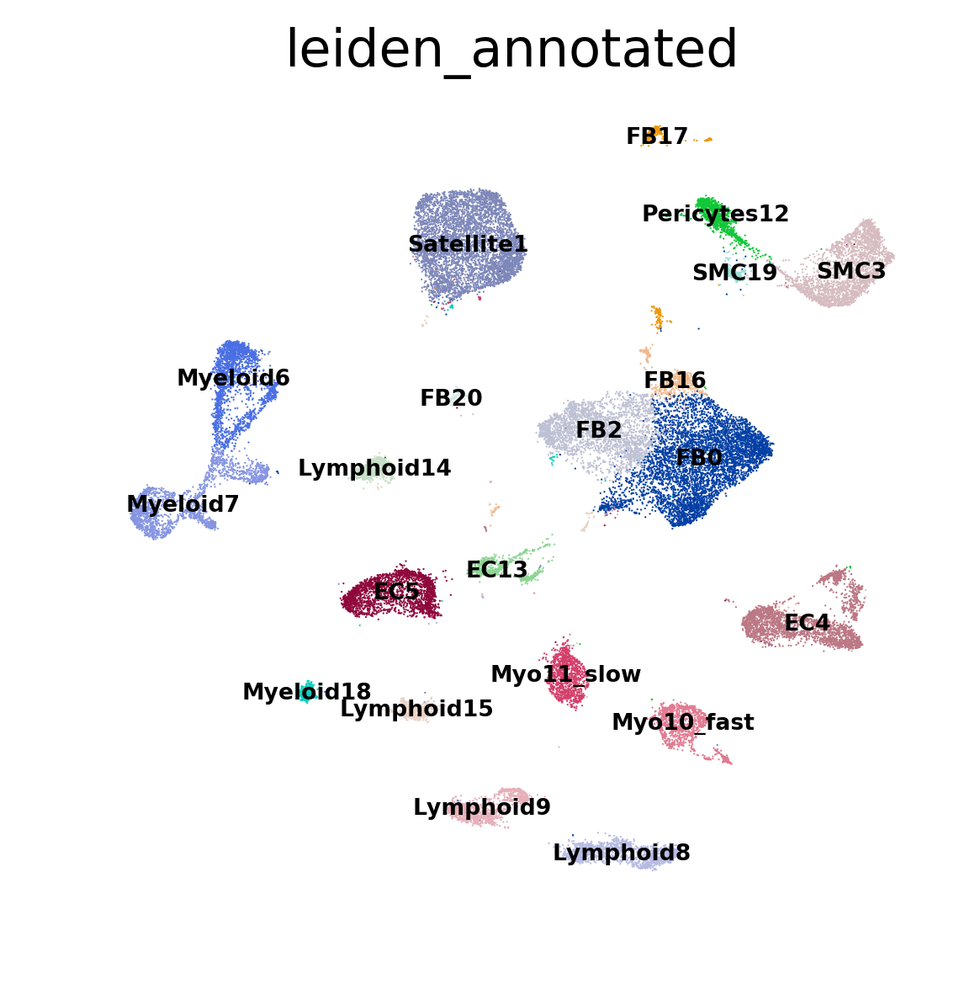

In [46]:
bbknn_donor.obs['leiden_annotated'] = bbknn_donor.obs['leiden']
bbknn_donor.obs['leiden_annotated'].cat.categories = ['FB0', 'Satellite1', 'FB2', 'SMC3', 'EC4', 'EC5', 'Myeloid6', 'Myeloid7', 'Lymphoid8', 'Lymphoid9',  'Myo10_fast', 'Myo11_slow', 
                                                      'Pericytes12', 'EC13', 'Lymphoid14', 'Lymphoid15', 'FB16', 'FB17', 'Myeloid18', 'SMC19', 'FB20']
sc.pl.umap(bbknn_donor, color = ['leiden_annotated'], size = 1, legend_fontsize = 6, legend_loc = 'on data', frameon = False)

In [47]:
## Create a new object with main matrix containing log-transformed HVG, raw containing non-transformed counts.
cd45_export = anndata.AnnData(X = bbknn_donor.X, obs = bbknn_donor.obs , var = bbknn_donor.var, obsm = bbknn_donor.obsm)
cd45_export.raw = cells_filtered.copy()
cd45_export

AnnData object with n_obs × n_vars = 34577 × 2482 
    obs: 'CoD', 'NRP', 'age', 'batch', 'donor', 'gender', 'sample', 'source', 'version', 'n_counts', 'percent_mito', 'percent_ribo', 'scrublet_score', 'n_genes', 'leiden', 'leiden_annotated'
    var: 'gene_ids-mus_SNuc7444586', 'feature_types-mus_SNuc7444586', 'gene_ids-mus_SNuc7468112', 'feature_types-mus_SNuc7468112', 'gene_ids-mus_SNuc7511880', 'feature_types-mus_SNuc7511880', 'gene_ids-5386STDY7600838', 'feature_types-5386STDY7600838', 'gene_ids-5386STDY7645353', 'feature_types-5386STDY7645353', 'gene_ids-5386STDY7645354', 'feature_types-5386STDY7645354', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    obsm: 'X_pca', 'X_umap', 'X_pca_original'

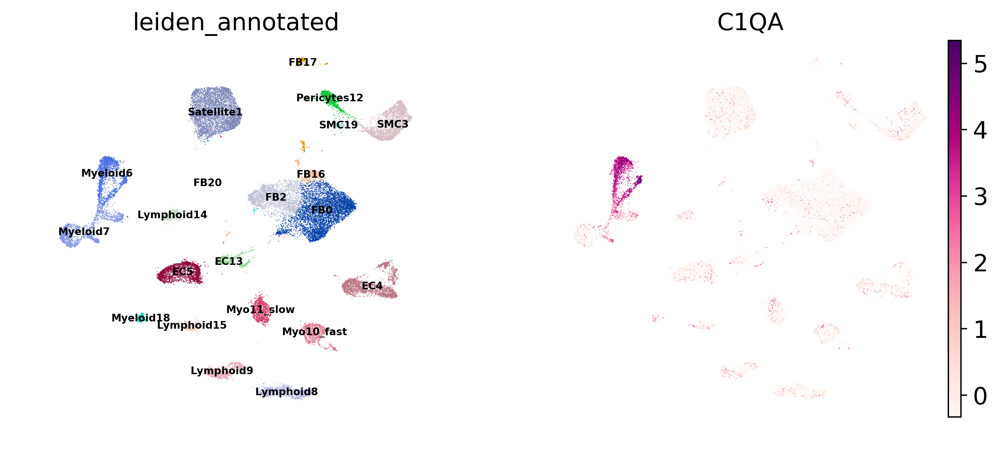

In [49]:
sc.pl.umap(cd45_export, color = ['leiden_annotated', 'C1QA'], size = 1, legend_fontsize = 6, legend_loc = 'on data', frameon = False, use_raw = False)

In [50]:
cd45_export.raw.shape

(34577, 33538)

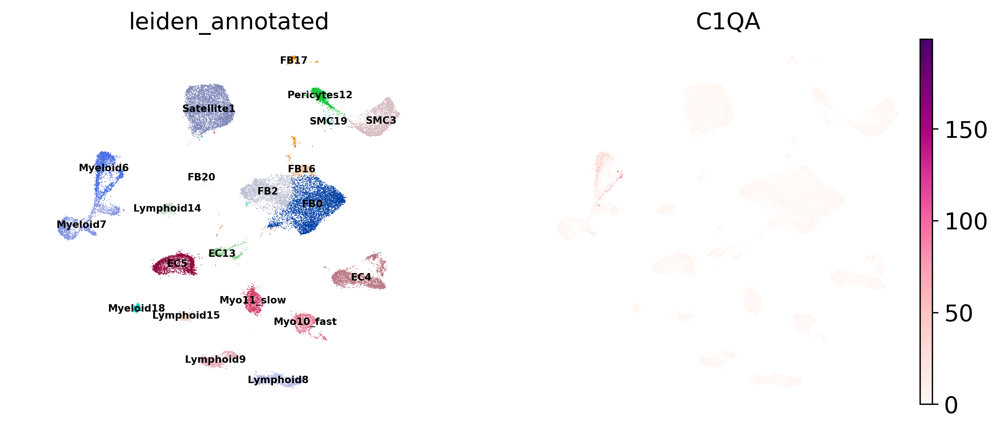

In [52]:
sc.pl.umap(cd45_export, color = ['leiden_annotated', 'C1QA'], size = 1, legend_fontsize = 6, legend_loc = 'on data', frameon = False, use_raw = True)

In [53]:
cd45_export.write('/home/jovyan/mona_data/SKM/hca_skm_cells_annotated_ml200527.h5ad')

In [54]:
samplexcell = pd.crosstab(bbknn_donor.obs['sample'], bbknn_donor.obs['leiden_annotated'])
samplexcell.to_csv('/home/jovyan/mona_data/SKM/tabulated_hca_skm_cells_annotated_ml200527.csv', index = True)